# Исследование объявлений о продаже квартир

Требуется научиться определять рыночную цену недвижимости в Санкт-Петербурге и окрестностях, найти параметры на нее влияющие, чтобы создать систему для отслеживания аномалий и мошеннической деятельности.

В процессе работы нужно подготовить данные, добавить фичи, провести исследовательский анализ, оценить корреляцию между ценой квартир и различными фичами.


### Описание данных  
Имеются данные, предоставленные пользователями, такие как цена, количество комнат, площадь квартиры, высота потолков и т.п.; а также картографические данные, такие как расстояния до центра, аэропорта, ближайшего парка и т.п.
По каждой квартире на продажу доступны два вида данных. Первые вписаны пользователем, вторые — получены автоматически на основе картографических данных. Например, расстояние до центра, аэропорта, ближайшего парка и водоёма.   
 

### План работы:

1. [Знакомство с данными](#1.-Знакомство-с-данными.) 


2. [Предобработка данных](#2.-Предобработка-данных.)
  - [Обработка пропусков](#Обработка-пропусков)
  - [Замена типа данных](#Замена-типа-данных)
   
 
3. [Добавление характеристик](#3.-Добавление-характеристик.)


4. [Исследовательский анализ данных](#4.-Исследовательский-анализ-данных.)
  
  
5. [Общий вывод](#5.-Общий-вывод.)
___

### 1. Знакомство с данными. 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt 
import plotly.express as px

#игнорирование предупреждений
import warnings
warnings.filterwarnings("ignore")

pd.set_option('display.max_columns', 100)

In [2]:
df = pd.read_csv('../datasets/real_estate_data.csv', sep='\t')
df.head(10)

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
0,20,13000000.0,108.00,2019-03-07T00:00:00,3,2.70,16.0,51.00,8,NaN,False,False,25.00,NaN,Санкт-Петербург,18863.0,16028.0,1.0,482.0,2.0,755.0,NaN
1,7,3350000.0,40.40,2018-12-04T00:00:00,1,NaN,11.0,18.60,1,NaN,False,False,11.00,2.0,посёлок Шушары,12817.0,18603.0,0.0,NaN,0.0,NaN,81.0
2,10,5196000.0,56.00,2015-08-20T00:00:00,2,NaN,5.0,34.30,4,NaN,False,False,8.30,0.0,Санкт-Петербург,21741.0,13933.0,1.0,90.0,2.0,574.0,558.0
3,0,64900000.0,159.00,2015-07-24T00:00:00,3,NaN,14.0,NaN,9,NaN,False,False,NaN,0.0,Санкт-Петербург,28098.0,6800.0,2.0,84.0,3.0,234.0,424.0
4,2,10000000.0,100.00,2018-06-19T00:00:00,2,3.03,14.0,32.00,13,NaN,False,False,41.00,NaN,Санкт-Петербург,31856.0,8098.0,2.0,112.0,1.0,48.0,121.0
5,10,2890000.0,30.40,2018-09-10T00:00:00,1,NaN,12.0,14.40,5,NaN,False,False,9.10,NaN,городской посёлок Янино-1,NaN,NaN,NaN,NaN,NaN,NaN,55.0
6,6,3700000.0,37.30,2017-11-02T00:00:00,1,NaN,26.0,10.60,6,NaN,False,False,14.40,1.0,посёлок Парголово,52996.0,19143.0,0.0,NaN,0.0,NaN,155.0
7,5,7915000.0,71.60,2019-04-18T00:00:00,2,NaN,24.0,NaN,22,NaN,False,False,18.90,2.0,Санкт-Петербург,23982.0,11634.0,0.0,NaN,0.0,NaN,NaN
8,20,2900000.0,33.16,2018-05-23T00:00:00,1,NaN,27.0,15.43,26,NaN,False,False,8.81,NaN,посёлок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,189.0
9,18,5400000.0,61.00,2017-02-26T00:00:00,3,2.50,9.0,43.60,7,NaN,False,False,6.50,2.0,Санкт-Петербург,50898.0,15008.0,0.0,NaN,0.0,NaN,289.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
total_images            23699 non-null int64
last_price              23699 non-null float64
total_area              23699 non-null float64
first_day_exposition    23699 non-null object
rooms                   23699 non-null int64
ceiling_height          14504 non-null float64
floors_total            23613 non-null float64
living_area             21796 non-null float64
floor                   23699 non-null int64
is_apartment            2775 non-null object
studio                  23699 non-null bool
open_plan               23699 non-null bool
kitchen_area            21421 non-null float64
balcony                 12180 non-null float64
locality_name           23650 non-null object
airports_nearest        18157 non-null float64
cityCenters_nearest     18180 non-null float64
parks_around3000        18181 non-null float64
parks_nearest           8079 non-null float64
ponds_around300

In [4]:
#количество пропусков
total = df.isnull().sum().sort_values(ascending=False)
percent = ((df.isnull().sum()/df.isnull().count())*100).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.style.format('{:.1f}', subset='Percent')

,Total,Percent
is_apartment,20924,88.3
parks_nearest,15620,65.9
ponds_nearest,14589,61.6
balcony,11519,48.6
ceiling_height,9195,38.8
airports_nearest,5542,23.4
cityCenters_nearest,5519,23.3
parks_around3000,5518,23.3
ponds_around3000,5518,23.3
days_exposition,3181,13.4


In [5]:
df.describe()

,total_images,last_price,total_area,rooms,ceiling_height,floors_total,living_area,floor,kitchen_area,balcony,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
count,23699.000000,2.369900e+04,23699.000000,23699.000000,14504.000000,23613.000000,21796.000000,23699.000000,21421.000000,12180.000000,18157.000000,18180.000000,18181.000000,8079.000000,18181.000000,9110.000000,20518.000000
mean,9.858475,6.541549e+06,60.348651,2.070636,2.771499,10.673824,34.457852,5.892358,10.569807,1.150082,28793.672193,14191.277833,0.611408,490.804555,0.770255,517.980900,180.888634
std,5.682529,1.088701e+07,35.654083,1.078405,1.261056,6.597173,22.030445,4.885249,5.905438,1.071300,12630.880622,8608.386210,0.802074,342.317995,0.938346,277.720643,219.727988
min,0.000000,1.219000e+04,12.000000,0.000000,1.000000,1.000000,2.000000,1.000000,1.300000,0.000000,0.000000,181.000000,0.000000,1.000000,0.000000,13.000000,1.000000
25%,6.000000,3.400000e+06,40.000000,1.000000,2.520000,5.000000,18.600000,2.000000,7.000000,0.000000,18585.000000,9238.000000,0.000000,288.000000,0.000000,294.000000,45.000000
50%,9.000000,4.650000e+06,52.000000,2.000000,2.650000,9.000000,30.000000,4.000000,9.100000,1.000000,26726.000000,13098.500000,0.000000,455.000000,1.000000,502.000000,95.000000
75%,14.000000,6.800000e+06,69.900000,3.000000,2.800000,16.000000,42.300000,8.000000,12.000000,2.000000,37273.000000,16293.000000,1.000000,612.000000,1.000000,729.000000,232.000000
max,50.000000,7.630000e+08,900.000000,19.000000,100.000000,60.000000,409.700000,33.000000,112.000000,5.000000,84869.000000,65968.000000,3.000000,3190.000000,3.000000,1344.000000,1580.000000


In [6]:
df['locality_name'].unique()

array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

### Вывод

Таблица с 23699 записями и 22 столбцами, из них только в 8 столбцах нет пропусков.  Категориальные переменные: `locality_name`; логические: `is_apartment`, `studio`, `open_plan`; и все остальные - количественные. Типы значений во многих столбцах нужно будет привести к более подходящим типам данных. Большой разброс значений во многих столбцах нужно будет изучить, имеются неправдоподобно большие или маленькие значения. В столбце `locality_name` дублируются записи с "е" и "ё". `is_apartment` содержит очень много пропусков (88%!), но непонятно, нужны ли нам вообще эти данные, может этот столбец можно вообще не трогать.


### 2. Предобработка данных.

### Обработка пропусков

In [7]:
#если отсутствует информация о балконе - скорей всего его нет, заменим пропуски нулями
df['balcony'].fillna(0, inplace=True)

In [8]:
# посмотрим, какие значения количества комнат в квартирах-студиях
df.query('studio==True')['rooms'].value_counts()

0    138
1     11
Name: rooms, dtype: int64

In [9]:
#есть квартиры с 1 комнатой, но это уже будут однокомнатные, посмотрим, что это за квартиры:
df.query('studio==True and rooms==1')


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition
2389,5,2250000.0,25.41,2016-06-07T00:00:00,1,NaN,12.0,17.08,8,False,True,False,NaN,2.0,Санкт-Петербург,14125.0,12921.0,2.0,328.0,2.0,485.0,26.0
3187,13,3800000.0,27.00,2016-05-17T00:00:00,1,NaN,14.0,18.00,8,False,True,False,NaN,2.0,Санкт-Петербург,50348.0,16053.0,0.0,NaN,0.0,NaN,45.0
4180,4,4500000.0,34.00,2016-04-25T00:00:00,1,2.8,10.0,21.00,10,False,True,False,NaN,2.0,Санкт-Петербург,23609.0,5299.0,0.0,NaN,1.0,433.0,62.0
8683,10,3500000.0,32.50,2016-05-05T00:00:00,1,3.0,23.0,29.90,11,False,True,False,NaN,2.0,Санкт-Петербург,34967.0,14640.0,0.0,NaN,1.0,564.0,45.0
11026,1,2800000.0,28.00,2016-05-04T00:00:00,1,NaN,26.0,19.00,6,False,True,False,NaN,2.0,посёлок Парголово,53511.0,19687.0,0.0,NaN,0.0,NaN,45.0
12935,10,2200000.0,31.00,2016-05-15T00:00:00,1,2.5,8.0,22.30,5,False,True,False,NaN,1.0,Никольское,NaN,NaN,NaN,NaN,NaN,NaN,44.0
15142,2,2700000.0,30.00,2016-05-10T00:00:00,1,NaN,21.0,26.00,6,False,True,False,NaN,0.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,55.0
18732,4,2400000.0,22.00,2016-05-06T00:00:00,1,NaN,10.0,15.00,6,NaN,True,False,NaN,0.0,деревня Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,45.0
20086,0,1550000.0,22.00,2016-05-11T00:00:00,1,2.7,15.0,10.94,14,False,True,False,NaN,2.0,Никольское,NaN,NaN,NaN,NaN,NaN,NaN,45.0
21702,9,2349000.0,23.40,2016-05-19T00:00:00,1,2.7,20.0,16.00,8,False,True,False,NaN,1.0,деревня Новое Девяткино,NaN,NaN,NaN,NaN,NaN,NaN,34.0


In [10]:
#данные о кухнях пропущены, предположим, что эти квартиры правильно записаны как студии, заменим количество комнат на 0:
df.loc[df['studio']==True, 'rooms'] = 0
df.loc[df['studio']==True, 'kitchen_area'] = 0
df['kitchen_area'].isnull().sum()

2129

In [11]:
# в квартирах свободной планировки на место пропусков в площади кухни тоже проставим нули
df.query('open_plan==True')['kitchen_area'].unique()
df.loc[df['open_plan']==True, 'kitchen_area'] = 0
df['kitchen_area'].isnull().sum()

2062

In [12]:
#заменим все "ё" на "е" в названиях населенных пунктов и 
#для удобства работы пропущенные значения заменим на "неизвестно"
df['locality_name'] = df['locality_name'].str.replace('ё','е')
df['locality_name'].fillna('неизвестно', inplace=True)
df['locality_name'].unique()

array(['Санкт-Петербург', 'поселок Шушары', 'городской поселок Янино-1',
       'поселок Парголово', 'поселок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина',
       'деревня Федоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'поселок Металлострой',
       'поселок городского типа Лебяжье',
       'поселок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'поселок Аннино',
       'поселок городского типа Ефимовский', 'поселок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'поселок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', 'поселок Новый Свет

In [13]:
# проверим, есть ли дубликаты
df.duplicated().sum()

0

### Вывод  

В данных много пропущенных значений, скорей всего они просто не были указаны продавцами и эти значения не добыть из выписки ЕГРН или картографических данных. В случае площади кухни, пропущенные значения в квартирах-студиях и со свободной планировкой можно заменить на нули, так как отдельной кухни нет. Количество комнат в квартирах-студиях было заменено на 0, где, видимо, по ошибке было указано 1. Пропуски в столбце о наличии балкона были заменены на 0. В названиях населенных пунктов есть дупликаты с "е" и "ё", была проведена замена. 

Дубликаты не были найдены.

In [14]:
df.isnull().sum()

total_images                0
last_price                  0
total_area                  0
first_day_exposition        0
rooms                       0
ceiling_height           9195
floors_total               86
living_area              1903
floor                       0
is_apartment            20924
studio                      0
open_plan                   0
kitchen_area             2062
balcony                     0
locality_name               0
airports_nearest         5542
cityCenters_nearest      5519
parks_around3000         5518
parks_nearest           15620
ponds_around3000         5518
ponds_nearest           14589
days_exposition          3181
dtype: int64

In [15]:
#заменим все пропуски в столбце апартаментов на False
df['is_apartment'].fillna(False, inplace=True)

In [16]:
# заменим пропуски в высоте потолков средним значением для населенных пунктов:
ceiling_mean_values_by_locality = df.pivot_table(index='locality_name', values='ceiling_height', dropna=False).sort_values(by='ceiling_height')
  
# для отсутствующих значений возьмем среднее от средних высот потолков:
ceiling_the_meanest_mean = ceiling_mean_values_by_locality['ceiling_height'].mean()
ceiling_mean_values_by_locality['ceiling_height'].fillna(ceiling_the_meanest_mean, inplace=True)
ceiling_mean_values_by_locality
# интересный факт: в Высоцке самые невысокие потолки  

,ceiling_height
locality_name,
Высоцк,2.433333
городской поселок Свирьстрой,2.450000
село Копорье,2.475000
поселок Старая Малукса,2.500000
поселок Ушаки,2.500000
...,...
село Никольское,2.822832
село Паша,2.822832
село Рождествено,2.822832


In [17]:
def ceiling_mean(row): 
    result = ceiling_mean_values_by_locality.loc[row['locality_name'], 'ceiling_height']
    return result

        
df['ceiling_height'].fillna(df.apply(ceiling_mean, axis=1), inplace=True)    

df['ceiling_height'].isna().sum()

0

In [18]:
# те же самые манипуляции со сроком продаж:
days_exposition_by_locality = df.pivot_table(index='locality_name', values='days_exposition', dropna=False).sort_values(by='days_exposition')

days_exposition_the_meanest_mean = days_exposition_by_locality['days_exposition'].mean()
days_exposition_by_locality['days_exposition'].fillna(days_exposition_the_meanest_mean, inplace=True)


def days_exp_mean(row): 
    result = days_exposition_by_locality.loc[row['locality_name'], 'days_exposition']
    return result

        
df['days_exposition'].fillna(df.apply(days_exp_mean, axis=1), inplace=True)    
df['days_exposition'].isna().sum()


0

### Замена типа данных

In [19]:
# столбец с датой приведем к типу datetime, чтоб можно было вытащить день, месяц и т.д.
df['first_day_exposition'] = pd.to_datetime(df['first_day_exposition'], format='%Y-%m-%dT%H:%M:%S')

#столбцы, в которых должны быть целочисленные значения, приведем к соответствующему типу:
columns_to_int = ['floors_total', 'balcony', 'parks_around3000', 'ponds_around3000']
df[columns_to_int] = df[columns_to_int].astype('Int64')

# для порядка приведем 'is_apartment' к булеву типу
df['is_apartment'] = df['is_apartment'].astype('bool')

df['days_exposition'] = df['days_exposition'].astype('int')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
total_images            23699 non-null int64
last_price              23699 non-null float64
total_area              23699 non-null float64
first_day_exposition    23699 non-null datetime64[ns]
rooms                   23699 non-null int64
ceiling_height          23699 non-null float64
floors_total            23613 non-null Int64
living_area             21796 non-null float64
floor                   23699 non-null int64
is_apartment            23699 non-null bool
studio                  23699 non-null bool
open_plan               23699 non-null bool
kitchen_area            21637 non-null float64
balcony                 23699 non-null Int64
locality_name           23699 non-null object
airports_nearest        18157 non-null float64
cityCenters_nearest     18180 non-null float64
parks_around3000        18181 non-null Int64
parks_nearest           8079 non-null float64
ponds_around30

### Вывод
Для работы с датами столбец `first_day_exposition` нужно привести к типу datetime, `floors_total` - это количество этажей, нужно изменить тип на int64, `is_apartment` - столбец с булевыми значениями, нужно привести к соответствующему типу, `balcony` - количество балконов, привести к целочисленному типу, `parks_around3000` и `ponds_around3000` - количество парков и прудов привести к целочисленному типу, `days_exposition` - количество дней должно быть целым, но возникает ошибка при попытке привести к целочисленному типу.

### 3. Добавление характеристик.

In [20]:
# Посчитаем и добавим цену квадратного метра:
df['sq_m_price'] = df['last_price'] / df['total_area']

#день недели, месяц и год публикации объявления:
df['publication_day'] = df['first_day_exposition'].dt.day
df['publication_month'] = df['first_day_exposition'].dt.month
df['publication_year'] = df['first_day_exposition'].dt.year

In [21]:
#этаж квартиры; варианты — первый, последний, другой;  
def floor_category(row):
    if row['floor'] == 1:
        return 'первый'
    elif row['floor'] == row['floors_total']:
        return 'последний'
    else:
        return 'другой'
df['floor_category'] = df.apply(floor_category, axis = 1)  

In [22]:
# соотношение жилой и общей площади, а также отношение площади кухни к общей:
df['living_to_total_ratio'] = df['living_area'] / df['total_area']
df['kitchen_to_total_ratio'] = df['kitchen_area'] / df['total_area']

In [23]:
df['living_to_total_ratio'].describe()

count    21796.000000
mean         0.564766
std          0.105368
min          0.021583
25%          0.495177
50%          0.567860
75%          0.637880
max          1.000000
Name: living_to_total_ratio, dtype: float64

In [24]:
df['kitchen_to_total_ratio'].describe()

count    21637.000000
mean         0.185484
std          0.074954
min          0.000000
25%          0.132558
50%          0.171429
75%          0.230916
max          0.787879
Name: kitchen_to_total_ratio, dtype: float64

Среднее и медиана соотношений площадей кухни и жилой к общей площади не сильно отличаются, возьмем средние значения этих коэффициентов для заполнения пропусков.

In [25]:
living_to_total_mean = df['living_to_total_ratio'].mean()
def fill_living_area(row):
    return row['total_area'] * living_to_total_mean

df['living_area'].fillna(df.apply(fill_living_area, axis=1), inplace=True)
df['living_area'].isna().sum()

0

In [26]:
kitchen_to_total_mean = df['kitchen_to_total_ratio'].mean()
def fill_kitchen_area(row):
    return row['total_area'] * kitchen_to_total_mean

df['kitchen_area'].fillna(df.apply(fill_kitchen_area, axis=1), inplace=True)
df['kitchen_area'].isna().sum()

0

In [27]:
# приведем все цены и площади к целочисленному типу:
cols_to_int = ['last_price', 'sq_m_price', 'kitchen_area', 'total_area', 'living_area']
df[cols_to_int] = df[cols_to_int].astype('int')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 29 columns):
total_images              23699 non-null int64
last_price                23699 non-null int64
total_area                23699 non-null int64
first_day_exposition      23699 non-null datetime64[ns]
rooms                     23699 non-null int64
ceiling_height            23699 non-null float64
floors_total              23613 non-null Int64
living_area               23699 non-null int64
floor                     23699 non-null int64
is_apartment              23699 non-null bool
studio                    23699 non-null bool
open_plan                 23699 non-null bool
kitchen_area              23699 non-null int64
balcony                   23699 non-null Int64
locality_name             23699 non-null object
airports_nearest          18157 non-null float64
cityCenters_nearest       18180 non-null float64
parks_around3000          18181 non-null Int64
parks_nearest             8079 n

### Вывод

Были посчитаны и добавлены в таблицу: 
- цена квадратного метра;
- день недели, месяц и год публикации объявления;
- этаж квартиры; варианты — первый, последний, другой;
- соотношение жилой и общей площади, а также отношение площади кухни к общей;
- также были приведены к целому типу все цены и площади. 

### 4. Исследовательский анализ данных.

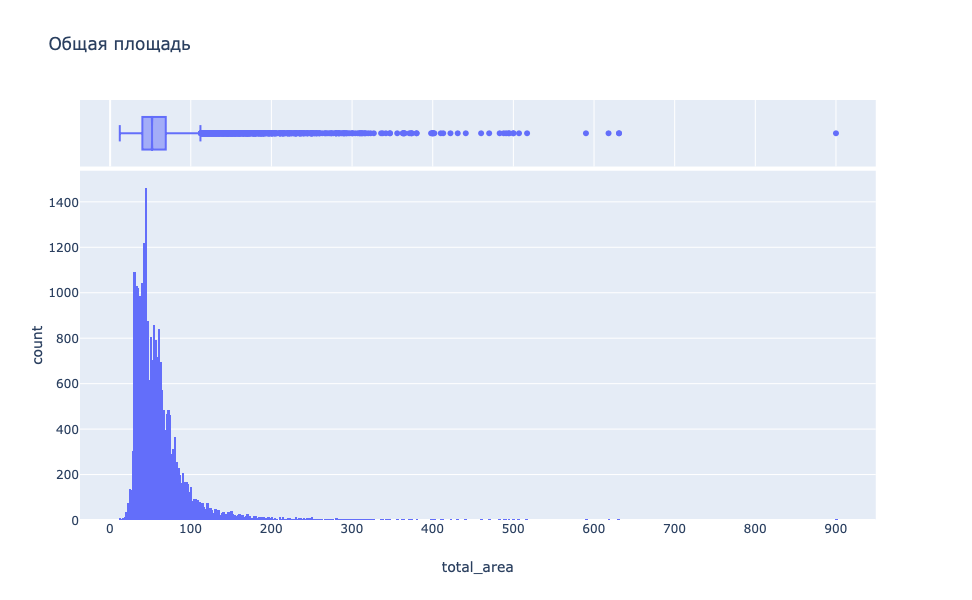

In [28]:
#Изучим следующие параметры: площадь, цена, число комнат, высота потолков. 
#Постром гистограммы для каждого параметра. 
fig = px.histogram(df, x = 'total_area', marginal = 'box', title = 'Общая площадь')
fig.show()

In [29]:
df.query('total_area < 30')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sq_m_price,publication_day,publication_month,publication_year,floor_category,living_to_total_ratio,kitchen_to_total_ratio
94,3,3500000,29,2019-04-26,1,2.500000,5,15,2,False,False,False,5,1,Санкт-Петербург,12921.0,7303.0,0,NaN,0,NaN,4,118644,26,4,2019,другой,0.528814,0.186441
114,5,4000000,21,2019-02-07,1,2.900000,8,8,7,False,False,False,6,0,Санкт-Петербург,27089.0,5791.0,2,488.0,1,286.0,182,186915,7,2,2019,другой,0.387850,0.294393
144,1,2450000,27,2017-03-30,0,2.922383,24,15,2,False,True,False,0,2,поселок Мурино,NaN,NaN,NaN,NaN,NaN,NaN,181,90740,30,3,2017,другой,0.574074,0.000000
237,4,2438033,28,2016-11-23,1,2.803709,NaN,20,1,False,False,False,5,0,Санкт-Петербург,22041.0,17369.0,0,NaN,1,374.0,251,86762,23,11,2016,первый,0.738434,NaN
296,4,1690000,28,2017-08-09,1,2.728776,5,17,1,False,False,False,6,0,Выборг,NaN,NaN,NaN,NaN,NaN,NaN,14,60357,9,8,2017,первый,0.607143,0.214286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23579,7,2350000,24,2018-06-07,1,2.702877,10,18,2,False,False,False,4,0,Кудрово,NaN,NaN,NaN,NaN,NaN,NaN,89,94758,7,6,2018,другой,0.725806,NaN
23592,10,1450000,29,2017-11-11,0,2.611111,9,18,8,False,False,True,0,2,Никольское,NaN,NaN,NaN,NaN,NaN,NaN,82,50000,11,11,2017,другой,0.620690,0.000000
23610,16,2950000,29,2018-08-04,1,2.500000,9,18,1,False,False,False,6,0,Санкт-Петербург,30081.0,12942.0,0,NaN,0,NaN,107,101724,4,8,2018,первый,0.641379,0.227586
23637,8,2350000,26,2018-06-26,0,2.641163,25,17,4,False,True,False,0,2,поселок Бугры,NaN,NaN,NaN,NaN,NaN,NaN,207,90384,26,6,2018,другой,0.653846,0.000000


In [30]:
df.query('total_area > 100')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sq_m_price,publication_day,publication_month,publication_year,floor_category,living_to_total_ratio,kitchen_to_total_ratio
0,20,13000000,108,2019-03-07,3,2.700000,16,51,8,False,False,False,25,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,182,120370,7,3,2019,другой,0.472222,0.231481
3,0,64900000,159,2015-07-24,3,2.803709,14,89,9,False,False,False,29,0,Санкт-Петербург,28098.0,6800.0,2,84.0,3,234.0,424,408176,24,7,2015,другой,NaN,NaN
19,16,14200000,121,2019-01-09,3,2.750000,16,76,8,False,False,False,12,0,Санкт-Петербург,38900.0,12843.0,0,NaN,0,NaN,97,117355,9,1,2019,другой,0.628099,0.099174
35,6,15500000,149,2017-06-26,5,2.803709,5,104,4,False,False,False,17,0,Санкт-Петербург,23670.0,3502.0,0,NaN,1,779.0,644,104026,26,6,2017,другой,0.697987,0.114094
42,13,22000000,161,2015-07-08,4,2.800000,4,80,2,False,False,False,17,5,Петергоф,35416.0,30605.0,2,47.0,1,907.0,987,135970,8,7,2015,другой,0.500000,0.108776
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23631,17,14799000,104,2018-11-18,3,3.100000,4,66,2,False,False,False,14,1,Санкт-Петербург,39047.0,13944.0,0,NaN,1,553.0,90,142298,18,11,2018,другой,0.634615,0.134615
23664,5,9000000,110,2015-12-10,4,3.360000,7,64,5,False,False,False,15,0,Санкт-Петербург,26313.0,5016.0,3,417.0,1,118.0,816,81818,10,12,2015,другой,0.587273,0.143636
23684,20,21400000,145,2018-11-02,4,3.000000,26,71,17,False,False,False,15,0,Санкт-Петербург,11827.0,11459.0,0,NaN,0,NaN,182,147586,2,11,2018,другой,0.492414,0.107586
23688,19,9200000,101,2019-04-01,3,3.050000,15,63,12,False,False,False,15,0,Санкт-Петербург,15632.0,14428.0,0,NaN,0,NaN,23,91089,1,4,2019,другой,0.623762,0.148515


Общая площадь имеет пик около 40 м2, но есть очень большие значения и очень маленькие.

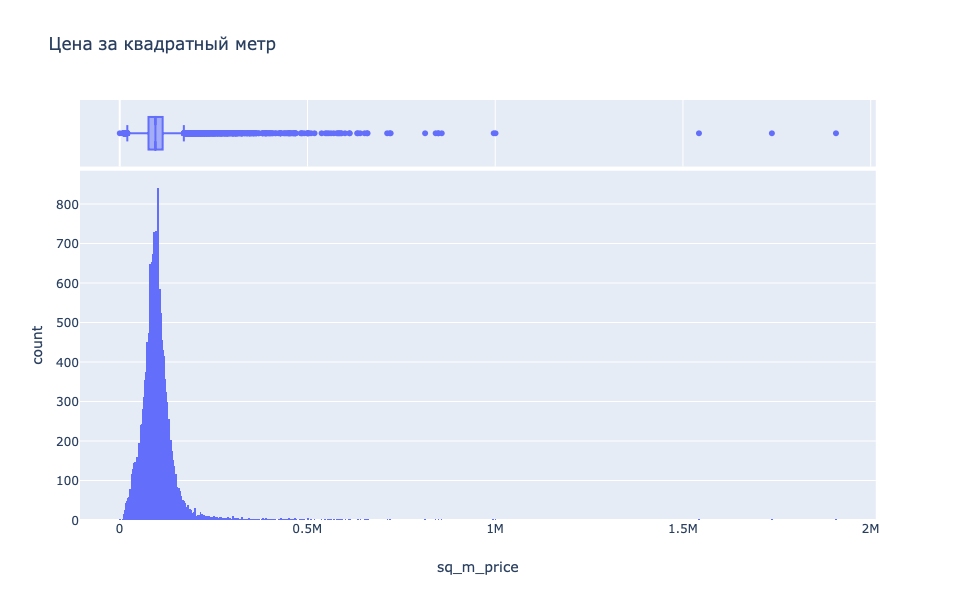

In [31]:
fig = px.histogram(df, x = 'sq_m_price', marginal = 'box', title = 'Цена за квадратный метр')
fig.show()

In [32]:
df.query('sq_m_price > 150000')['total_area'].mean()

97.80172413793103

In [33]:
df.query('sq_m_price < 30000')['total_area'].mean()

51.628755364806864

Пик цены за кв. м около 100 000 руб., но есть и очень большие значения > 150 000 и маленькие < 30 000.

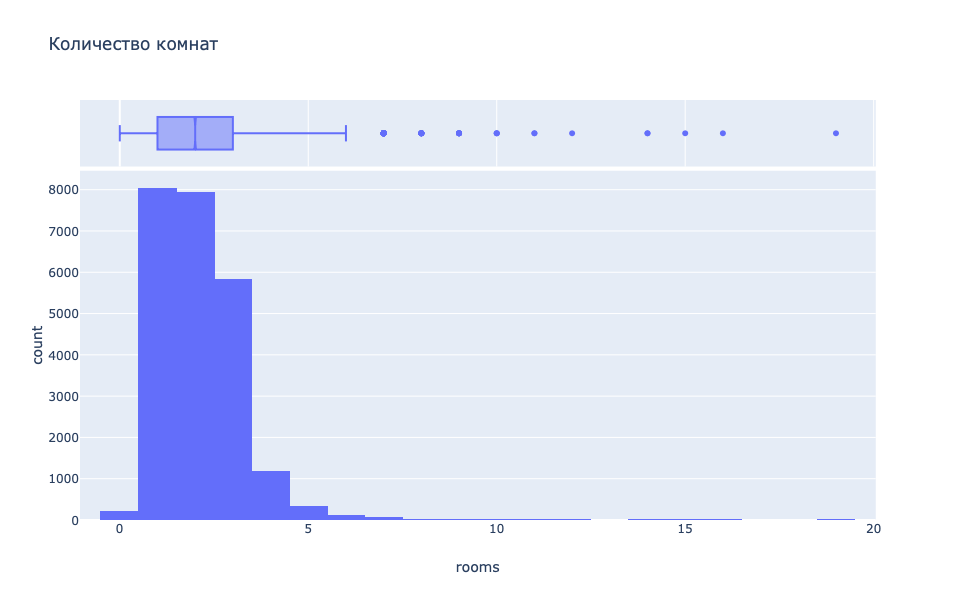

In [34]:
fig = px.histogram(df, x = 'rooms', marginal = 'box', title = 'Количество комнат')
fig.show()

В основном 1-2 комнаты, 0 комнат - это студии и квартиры со свободной планировкой, но есть и квартиры с более чем 6 комнатами.

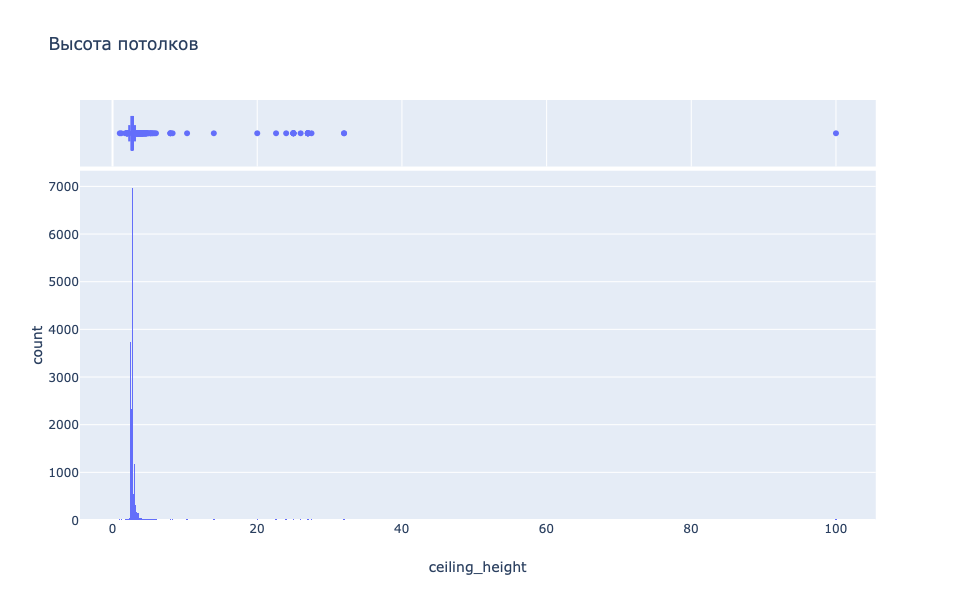

In [35]:
fig = px.histogram(df, x = 'ceiling_height', marginal = 'box', title = 'Высота потолков')
fig.show()

Разумные значения высоты потолков 2-4 метра, но есть и выбросы со значительно бОльшими и меньшими значениями.

---

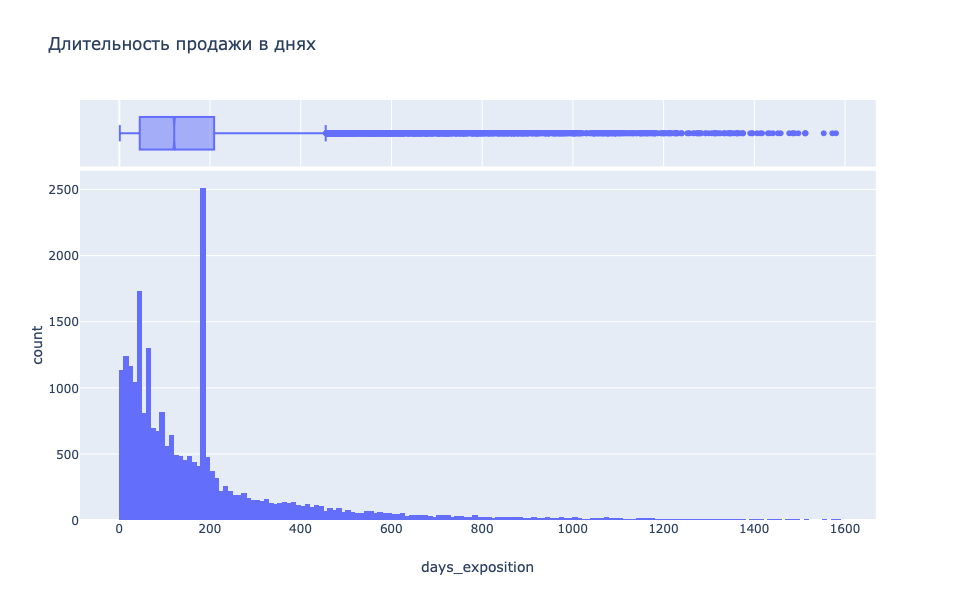

In [36]:
#Изучим время продажи квартиры.
fig = px.histogram(df, x = 'days_exposition', marginal = 'box', title = 'Длительность продажи в днях')
fig.show()

In [37]:
df['days_exposition'].agg(['mean','median'])

mean      181.058526
median    121.000000
Name: days_exposition, dtype: float64

Время продажи колеблется от 1 дня до 1600 дней, но верхний ус заканчивается на значении в 455 дней (Q3 + (Q3-Q1) x 1.5 = 209 + 164 x 1.5), после этого значения будем считать выбросами. Медианное время продажи квартиры 121 дней. Очень быстрая продажа - это значения меньше 45 дней, а долгая - больше 209 дней.  

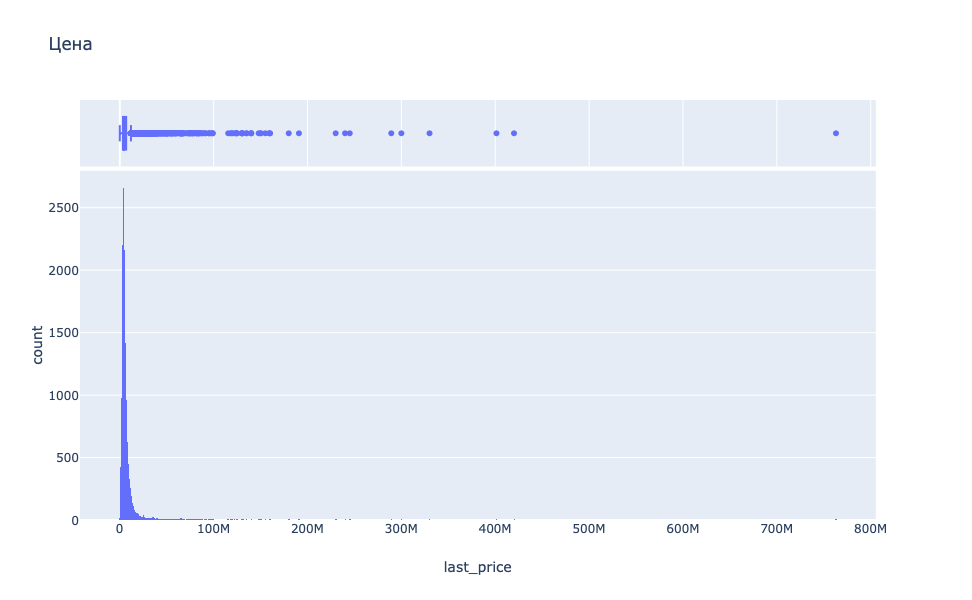

In [38]:
fig = px.histogram(df, x = 'last_price', marginal = 'box', title = 'Цена')
fig.show()

Основная часть квартир имеет цену от 1 млн до 8 млн рублей.

In [39]:
#Уберем редкие и выбивающиеся значения и создадим новую таблицу:
good_df = df.query('30 < total_area < 100 and 30000 < sq_m_price< 150000 and 0<= rooms<=6 and 2.0<= ceiling_height <= 4.0 and 0< days_exposition < 455 and 1000000 < last_price < 8000000')

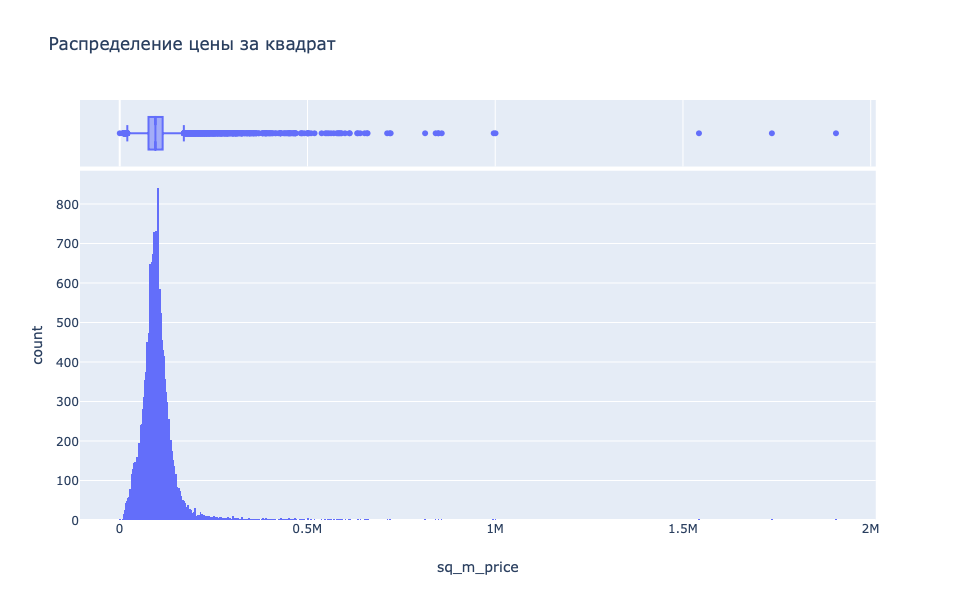

In [40]:
fig = px.histogram(df, x = 'sq_m_price', marginal = 'box', title = 'Распределение цены за квадрат')
fig.show()


In [41]:
# В общем количестве этажей были нереалистично большие значения, избавимся и от них
good_df.query('floors_total > 35')

,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sq_m_price,publication_day,publication_month,publication_year,floor_category,living_to_total_ratio,kitchen_to_total_ratio
397,15,5990000,54,2018-03-22,2,2.803709,36,21,28,False,False,False,18,1,Санкт-Петербург,18732.0,20444.0,0,NaN,3,80.0,11,110925,22,3,2018,другой,0.396296,0.346296
2253,12,3800000,45,2018-06-28,2,2.880000,60,27,4,False,False,False,7,0,Кронштадт,67763.0,49488.0,2,342.0,3,614.0,166,83516,28,6,2018,другой,0.602198,0.162637
16731,9,3978000,40,2018-09-24,1,2.650000,52,10,18,False,False,False,14,0,Санкт-Петербург,20728.0,12978.0,1,793.0,0,NaN,45,99450,24,9,2018,другой,0.262500,0.350000


In [42]:
good_df = good_df.query('floors_total <= 35')

In [43]:
good_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15940 entries, 1 to 23698
Data columns (total 29 columns):
total_images              15940 non-null int64
last_price                15940 non-null int64
total_area                15940 non-null int64
first_day_exposition      15940 non-null datetime64[ns]
rooms                     15940 non-null int64
ceiling_height            15940 non-null float64
floors_total              15940 non-null Int64
living_area               15940 non-null int64
floor                     15940 non-null int64
is_apartment              15940 non-null bool
studio                    15940 non-null bool
open_plan                 15940 non-null bool
kitchen_area              15940 non-null int64
balcony                   15940 non-null Int64
locality_name             15940 non-null object
airports_nearest          11773 non-null float64
cityCenters_nearest       11781 non-null float64
parks_around3000          11781 non-null Int64
parks_nearest             4622 n

### Вывод

В столбце `last_price`очень большой разброс значений, но на эти значения нет смысла смотреть, лучше изучить цену за квадратный метр. В `ceiling_height` есть неправдоподобные значения в 100м, `floors_total` имеет максимальное значение в 60 этажей, что вряд ли правда, толко если это не Лахта центр. `days_exposition`содержит очень большие значения, которые удваивают среднее значение по сравнению с медианой. 

Основываясь на исследовательском анализе данных, было решено оставить значения: 
```30 < total_area < 100 and 30000 < sq_m_price< 150000 and 0<= rooms<=6 and 2.0<= ceiling_height <= 4.0 and 0< days_exposition < 455 and floors_total <= 35 and 1000000 < last_price < 8000000```

---

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faf101dffd0>,
      dtype=object)

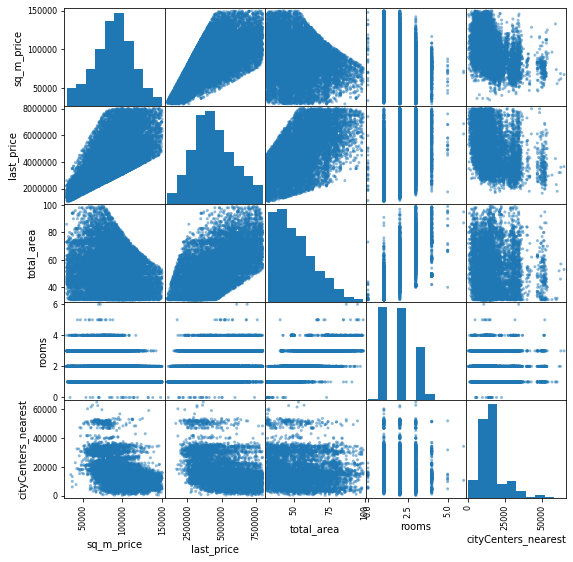

In [44]:
#Рассмотрим, какие факторы больше всего влияют на стоимость квартиры
#Изучим, зависит ли цена от площади, числа комнат, удалённости от центра. 

check_corr = good_df[['sq_m_price', 'last_price', 'total_area', 'rooms', 'cityCenters_nearest']]
pd.plotting.scatter_matrix(check_corr, figsize=(9, 9))

In [45]:
check_corr.corr()

,sq_m_price,last_price,total_area,rooms,cityCenters_nearest
sq_m_price,1.000000,0.596094,-0.243014,-0.313293,-0.383717
last_price,0.596094,1.000000,0.608090,0.396262,-0.298207
total_area,-0.243014,0.608090,1.000000,0.797026,-0.023028
rooms,-0.313293,0.396262,0.797026,1.000000,-0.018961
cityCenters_nearest,-0.383717,-0.298207,-0.023028,-0.018961,1.000000


In [46]:
#проверим, что корреляция до фильтрации данных была похожей
check_corr_raw = df[['sq_m_price', 'last_price', 'total_area', 'rooms', 'cityCenters_nearest']]
check_corr_raw.corr()

,sq_m_price,last_price,total_area,rooms,cityCenters_nearest
sq_m_price,1.000000,0.736499,0.301851,0.055370,-0.317951
last_price,0.736499,1.000000,0.653654,0.363264,-0.206747
total_area,0.301851,0.653654,1.000000,0.758269,-0.231466
rooms,0.055370,0.363264,0.758269,1.000000,-0.184784
cityCenters_nearest,-0.317951,-0.206747,-0.231466,-0.184784,1.000000


Наблюдается линейная зависимость между общей площадью и конечной ценой. Разброс цен увеличивается с увеличением количества комнат, и не всегда бОльшее количество комнат повышает цену.  

Увеличение общей площади и количества комнат уменьшает цену за квадратный метр, эта тенденция появилась после удаления выбросов из данных, возможно, потому что убрали все безумно дорогие квартиры с большим количеством комнат и квадратных метров.  

При отдалении от центра, цены уменьшаются, что логично.

***

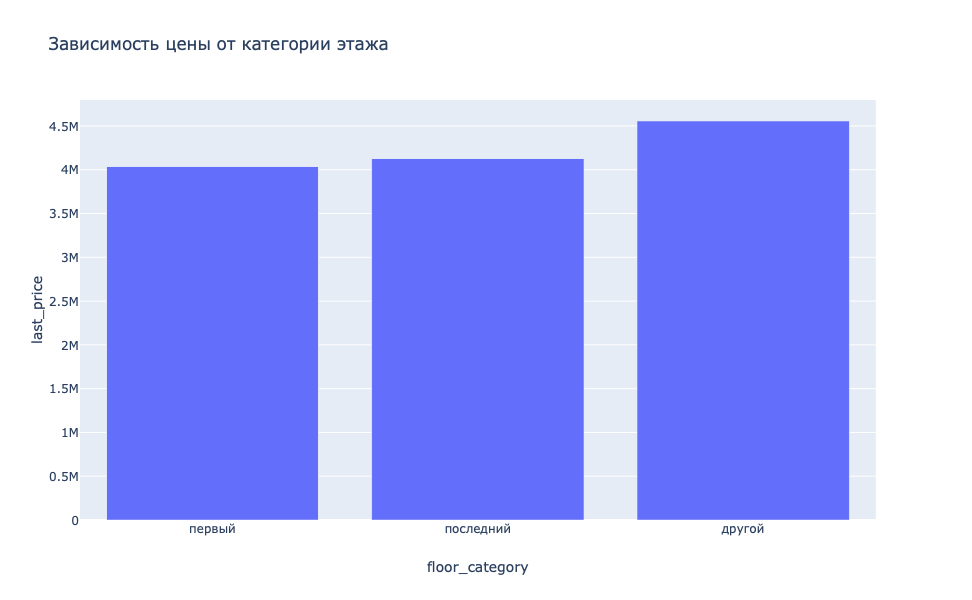

In [47]:
#Изучим зависимость цены от того, на каком этаже расположена квартира: первом, последнем или другом. 
floors_pivot = good_df.pivot_table(index='floor_category', values='last_price').reset_index().sort_values(by='last_price')
fig = px.bar(floors_pivot, x='floor_category', y='last_price', title='Зависимость цены от категории этажа')
fig.show()


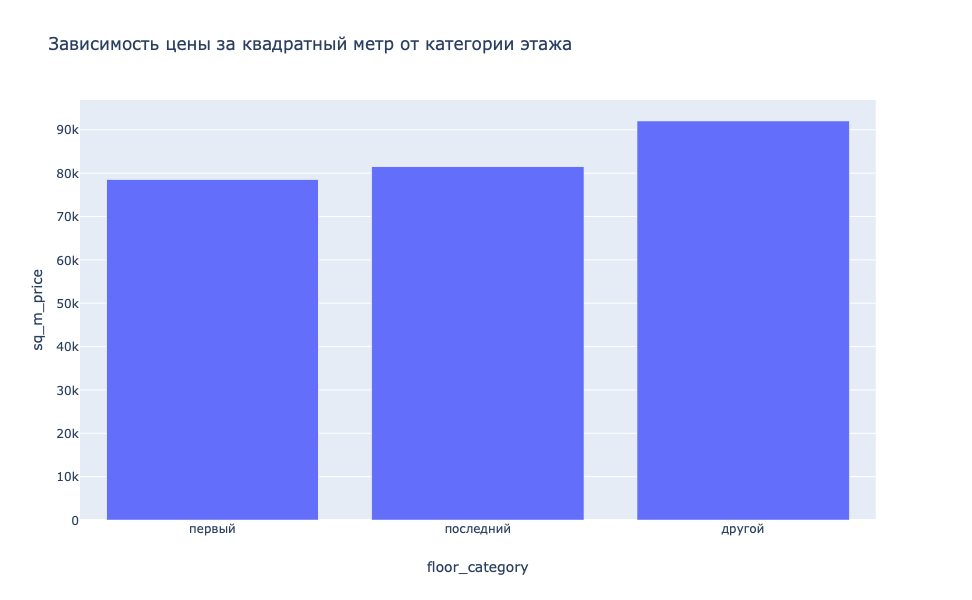

In [48]:
floors_pivot = good_df.pivot_table(index='floor_category', values='sq_m_price').reset_index().sort_values(by='sq_m_price')
fig = px.bar(floors_pivot, x='floor_category', y='sq_m_price', title='Зависимость цены за квадратный метр от категории этажа')
fig.show()

Цены на первом и последнем этажах в среднем дешевле, чем на остальных.

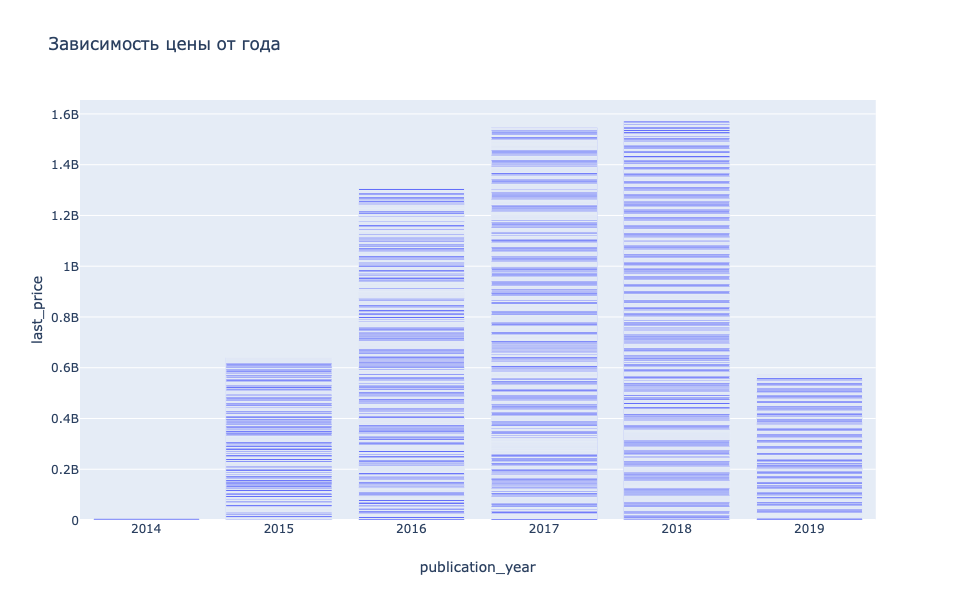

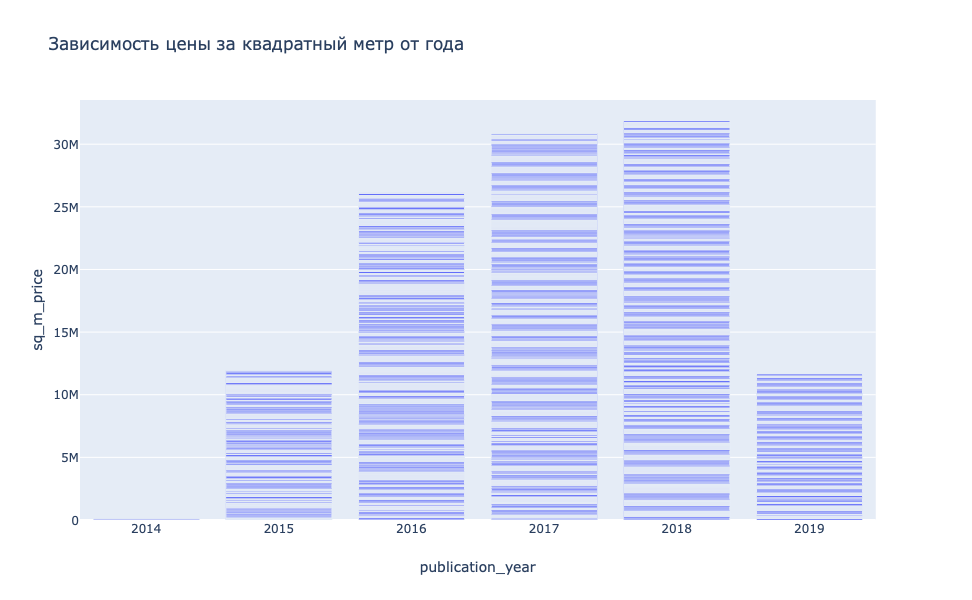

In [49]:
#Изучим зависимость от даты размещения: дня недели, месяца и года.
date_pivot = good_df.pivot_table(index=['publication_year', 'publication_month', 'publication_day'], values = ['last_price','sq_m_price']).reset_index()

fig1 = px.bar(date_pivot, x='publication_year', y='last_price', title='Зависимость цены от года')
fig1.show()
fig2 = px.bar(date_pivot, x='publication_year', y='sq_m_price', title='Зависимость цены за квадратный метр от года')
fig2.show()

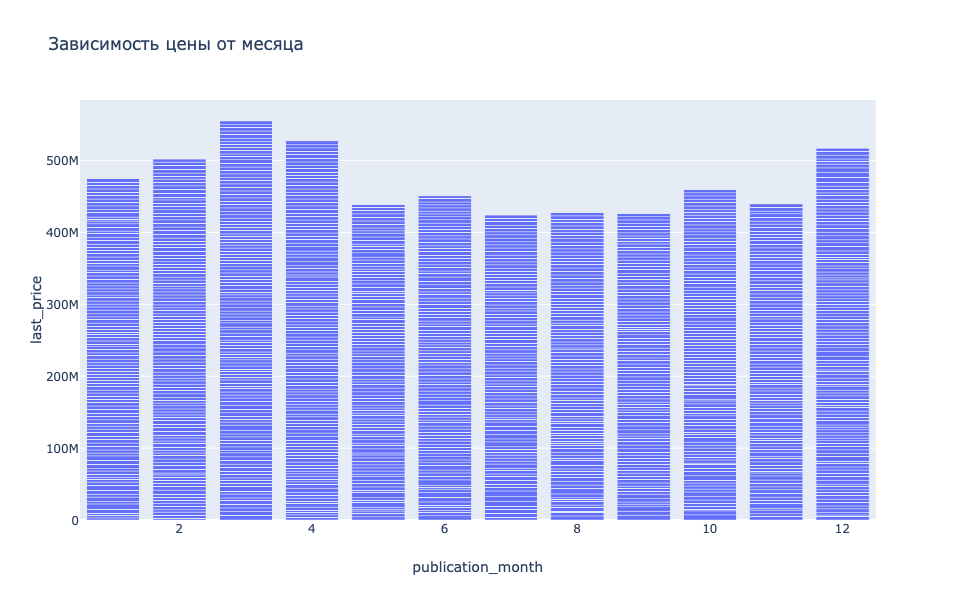

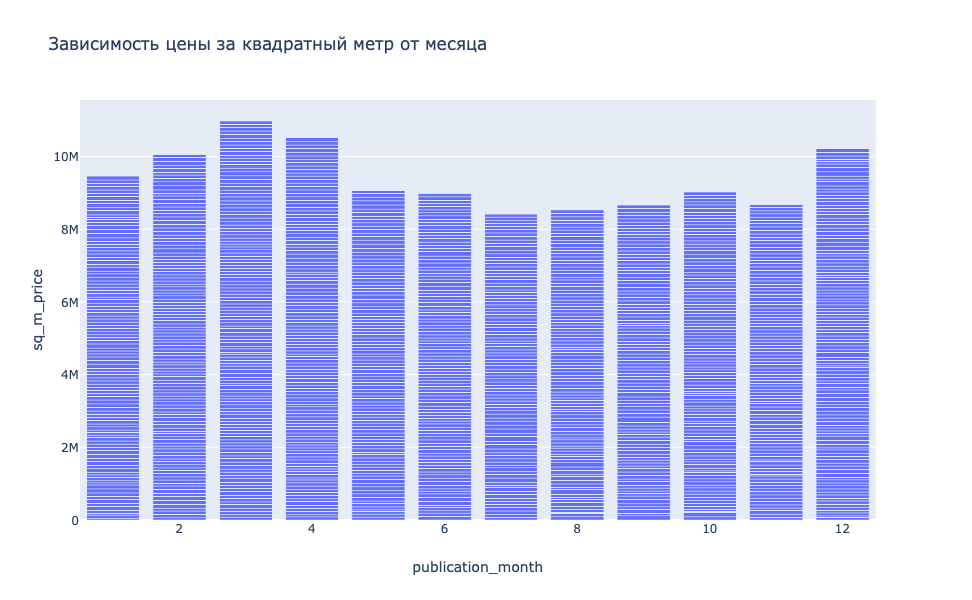

In [50]:
fig1 = px.bar(date_pivot, x='publication_month', y='last_price', title='Зависимость цены от месяца')
fig1.show()
fig2 = px.bar(date_pivot, x='publication_month', y='sq_m_price', title='Зависимость цены за квадратный метр от месяца')
fig2.show()

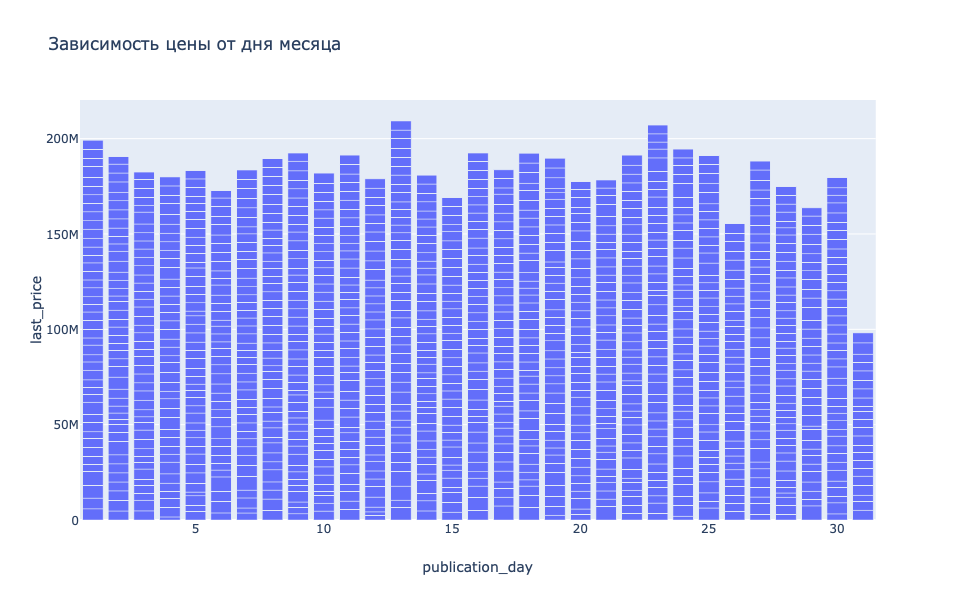

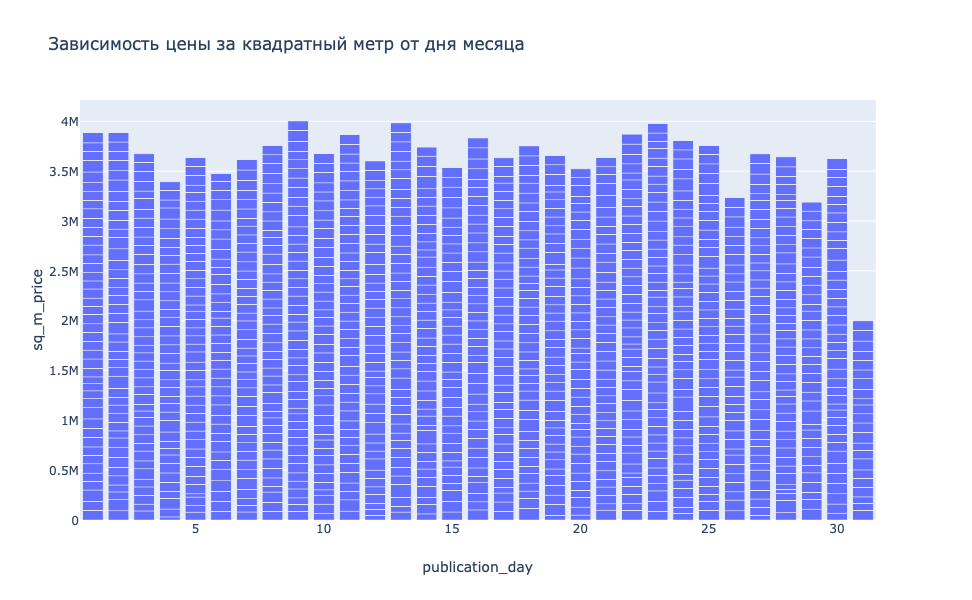

In [51]:
fig1 = px.bar(date_pivot, x='publication_day', y='last_price', title='Зависимость цены от дня месяца')
fig1.show()
fig2 = px.bar(date_pivot, x='publication_day', y='sq_m_price', title='Зависимость цены за квадратный метр от дня месяца')
fig2.show()

### Вывод  
Цены на квартиры росли с 2014 года и достигли пика в 2018 году, впрочем возможно, что у нас не вся информация за 2019 год, и цены могли расти и дальше. Цены были выше в марте-апреле и под Новый год. От дня месяца цена не сильно зависит. На графике видно минимальные значения в последний день месяца, так как 31 день есть только в половине месяцев.
***

In [52]:
#Выберем 10 населённых пунктов с наибольшим числом объявлений. 
top10 = good_df['locality_name'].value_counts().sort_values(ascending=False).head(10)
top10


Санкт-Петербург      9805
поселок Мурино        434
поселок Шушары        381
Всеволожск            334
Колпино               295
поселок Парголово     289
Пушкин                255
Гатчина               252
деревня Кудрово       225
Выборг                183
Name: locality_name, dtype: int64

In [53]:
top10_df = df.query('locality_name in @top10.index')
top10_df


,total_images,last_price,total_area,first_day_exposition,rooms,ceiling_height,floors_total,living_area,floor,is_apartment,studio,open_plan,kitchen_area,balcony,locality_name,airports_nearest,cityCenters_nearest,parks_around3000,parks_nearest,ponds_around3000,ponds_nearest,days_exposition,sq_m_price,publication_day,publication_month,publication_year,floor_category,living_to_total_ratio,kitchen_to_total_ratio
0,20,13000000,108,2019-03-07,3,2.700000,16,51,8,False,False,False,25,0,Санкт-Петербург,18863.0,16028.0,1,482.0,2,755.0,182,120370,7,3,2019,другой,0.472222,0.231481
1,7,3350000,40,2018-12-04,1,2.644470,11,18,1,False,False,False,11,2,поселок Шушары,12817.0,18603.0,0,NaN,0,NaN,81,82920,4,12,2018,первый,0.460396,0.272277
2,10,5196000,56,2015-08-20,2,2.803709,5,34,4,False,False,False,8,0,Санкт-Петербург,21741.0,13933.0,1,90.0,2,574.0,558,92785,20,8,2015,другой,0.612500,0.148214
3,0,64900000,159,2015-07-24,3,2.803709,14,89,9,False,False,False,29,0,Санкт-Петербург,28098.0,6800.0,2,84.0,3,234.0,424,408176,24,7,2015,другой,NaN,NaN
4,2,10000000,100,2018-06-19,2,3.030000,14,32,13,False,False,False,41,0,Санкт-Петербург,31856.0,8098.0,2,112.0,1,48.0,121,100000,19,6,2018,другой,0.320000,0.410000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23689,13,3550000,35,2018-02-28,1,2.860000,15,16,4,False,False,False,9,2,Санкт-Петербург,17284.0,16081.0,1,353.0,2,652.0,29,100566,28,2,2018,другой,0.461756,0.257790
23690,3,5500000,52,2018-07-19,2,2.803709,5,31,2,False,False,False,6,0,Санкт-Петербург,20151.0,6263.0,1,300.0,0,NaN,15,105769,19,7,2018,другой,0.596154,0.115385
23691,11,9470000,72,2016-10-13,2,2.750000,25,40,7,False,False,False,10,1,Санкт-Петербург,19424.0,4489.0,0,NaN,1,806.0,519,129903,13,10,2016,другой,0.552812,0.145405
23694,9,9700000,133,2017-03-21,3,3.700000,5,73,3,False,False,False,13,0,Санкт-Петербург,24665.0,4232.0,1,796.0,3,381.0,182,72490,21,3,2017,другой,0.547792,0.103356


In [54]:
##Посчитаем среднюю цену квадратного метра в этих населённых пунктах.
top10_mean_price = top10_df.pivot_table(index='locality_name', values='sq_m_price').sort_values(by='sq_m_price',ascending=False)
top10_mean_price

,sq_m_price
locality_name,
Санкт-Петербург,114848.565231
Пушкин,103125.373984
деревня Кудрово,92473.086957
поселок Парголово,90175.489297
поселок Мурино,85681.305755
поселок Шушары,78676.904545
Колпино,75424.150888
Гатчина,68745.693811
Всеволожск,68654.007538


Максимальная цена за квадратный метр в Санкт-Петербурге 
из 10 самых представленных населенных пунктов, а минимальная в Выборге.

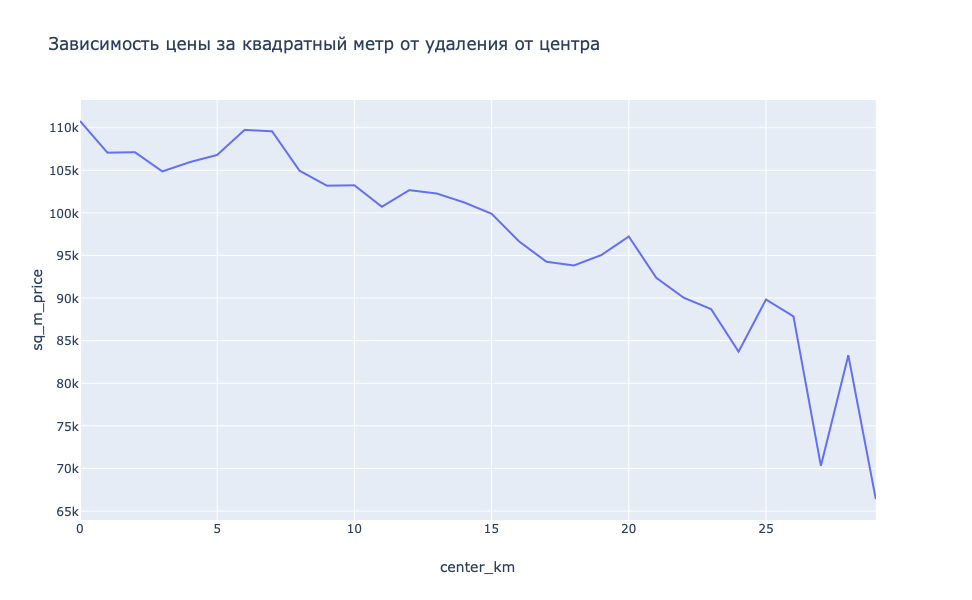

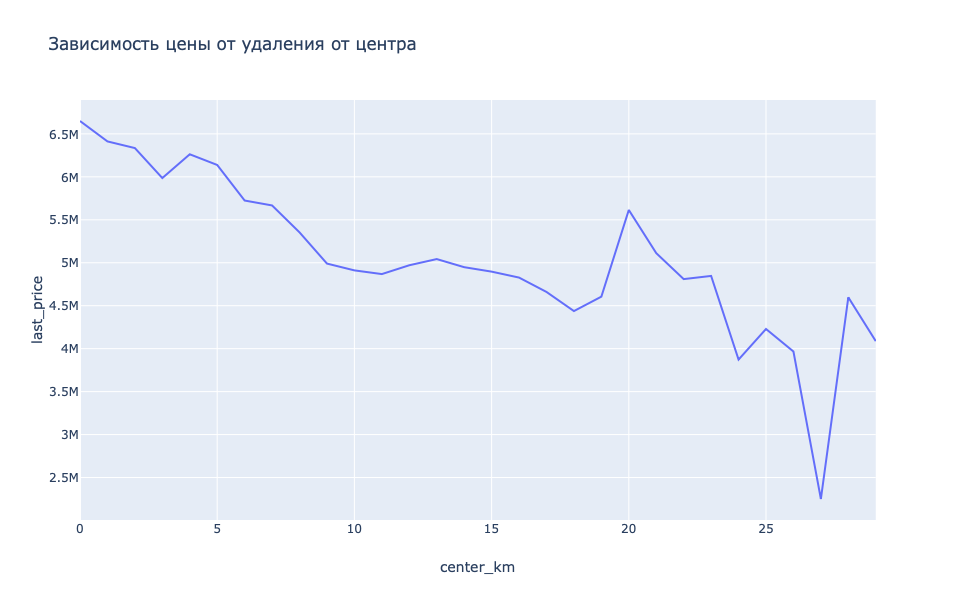

In [55]:
#Выделим квартиры в Санкт-Петербурге 
#Выясним, какая область входит в
#центр. Создадим столбец с расстоянием до центра в километрах: округлим
#до целых значений. После этого посчитаем среднюю цену для каждого 
#километра. 
df_spb = good_df.query('locality_name=="Санкт-Петербург"')
df_spb['center_km'] = (df_spb['cityCenters_nearest'] / 1000).round()

#Построим график: он должен показывать, как цена зависит 
#от удалённости от центра. Определим границу, где график сильно меняется — это и будет центральная зона.
df_spb_pivot = df_spb.pivot_table(index='center_km', values=['sq_m_price', 'last_price']).reset_index()
fig1 = px.line(df_spb_pivot, x='center_km', y='sq_m_price', title='Зависимость цены за квадратный метр от удаления от центра')
fig1.show()
fig2 = px.line(df_spb_pivot, x='center_km', y='last_price', title='Зависимость цены от удаления от центра')
fig2.show()

После 7 км наблюдается спад цен. Будем считать эту область центром. 

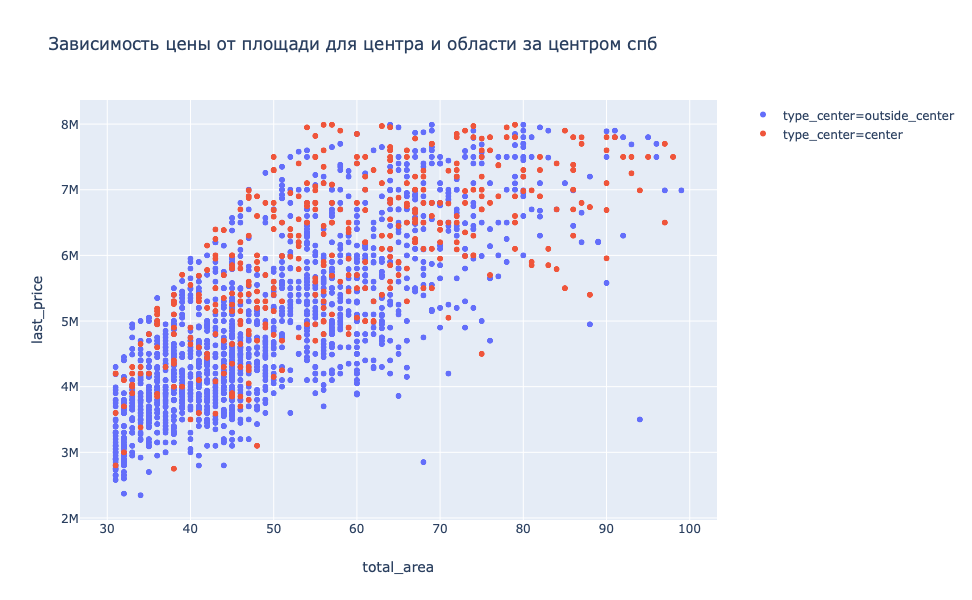

,type_center,rooms,last_price
0,center,0,5.730000e+06
1,center,1,5.085156e+06
2,center,2,5.964226e+06
3,center,3,6.579913e+06
4,center,4,7.067021e+06
5,center,5,7.600000e+06
6,outside_center,0,3.577143e+06
7,outside_center,1,4.186381e+06
8,outside_center,2,5.159055e+06
9,outside_center,3,5.680311e+06


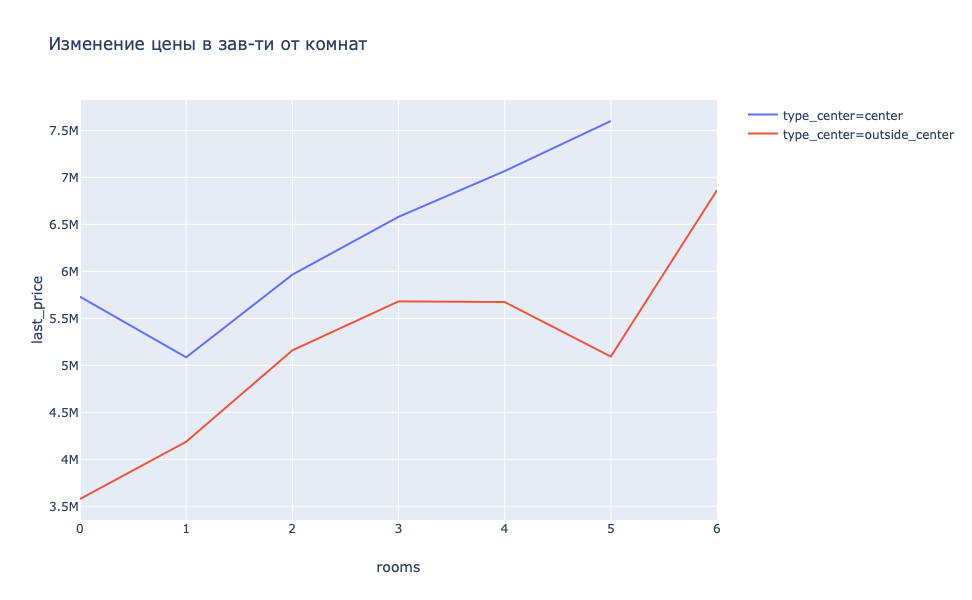

,type_center,Средняя высота потолков
0,center,2.908609
1,outside_center,2.694326


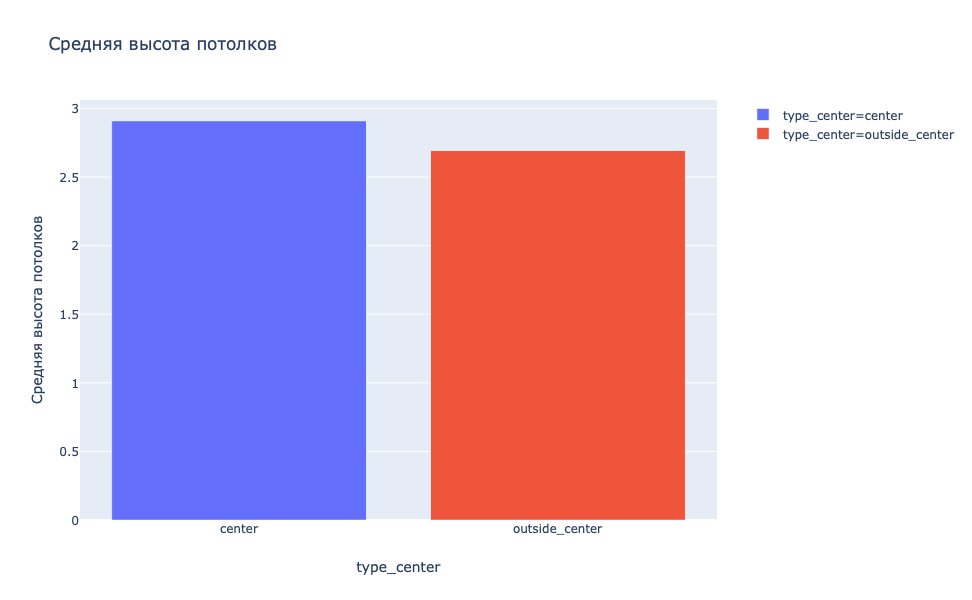

In [56]:
df_spb['type_center']= df_spb.loc[df_spb['center_km'] <=7, 'type_center']='center'
df_spb.loc[df_spb['center_km'] >7, 'type_center']='outside_center'

# теперь посмотрим корреляцию с площадью для центра и области за центром Спб, как видишь я крашу с помощью color

fig = px.scatter(df_spb.dropna(), x = 'total_area', y = 'last_price', color = 'type_center', title = 'Зависимость цены от площади для центра и области за центром спб')
fig.show()


rooms_spb_pivot = df_spb.pivot_table(index = ['type_center', 'rooms'], values = 'last_price', aggfunc = 'mean').reset_index()
display(rooms_spb_pivot)


fig = px.line(rooms_spb_pivot, x = 'rooms', y = 'last_price', color = 'type_center', title = 'Изменение цены в зав-ти от комнат')
fig.show()


piv = df_spb.pivot_table(index = 'type_center', values = 'ceiling_height', aggfunc = 'mean').reset_index()
piv.columns = ['type_center', 'Средняя высота потолков']
display(piv)

fig = px.bar(piv, x = 'type_center', y = 'Средняя высота потолков', title = 'Средняя высота потолков', color = 'type_center')
fig.show()




,type_center,floor_category,last_price
0,center,другой,6.081390e+06
1,center,первый,5.602555e+06
2,center,последний,6.038707e+06
3,outside_center,другой,4.964314e+06
4,outside_center,первый,4.609495e+06
5,outside_center,последний,4.690353e+06


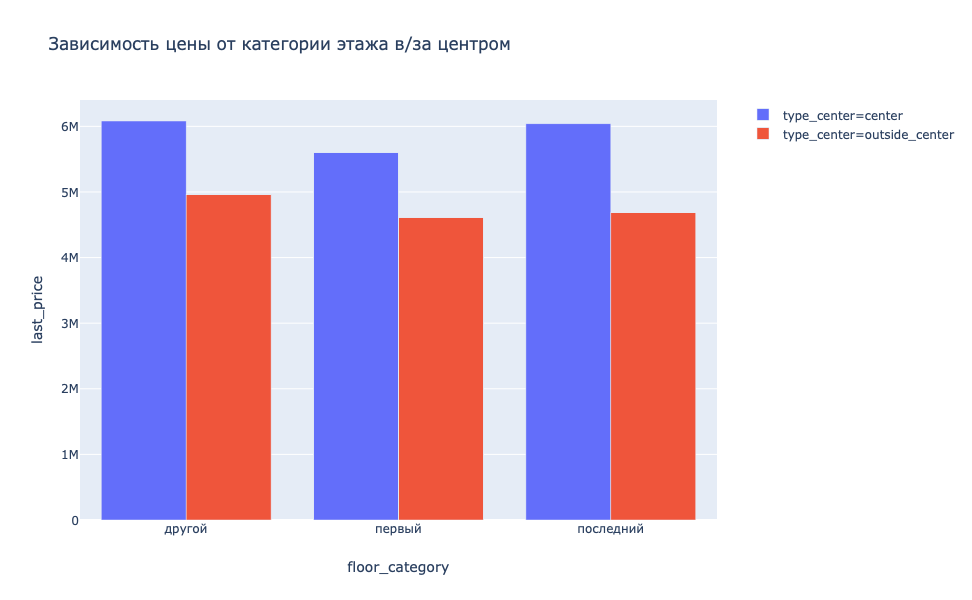

In [57]:
# зависимость цены от категории этажа в центре и вне центра
floors_piv = df_spb.pivot_table(index=['type_center','floor_category'], values='last_price').reset_index()
display(floors_piv)
fig = px.bar(floors_piv, x='floor_category', y='last_price', barmode='group',title='Зависимость цены от категории этажа в/за центром', color='type_center')
fig.show()

In [58]:
center_spb_piv = df_spb.pivot_table(index = ['type_center', 'center_km'], values = 'last_price').reset_index()
#display(center_spb_piv.head())
(print('Коэффициент корреляции между расстоянием от центра и ценой для квартир в центральной зоне: {:.2f}'
       .format(center_spb_piv.query('type_center == "center"')['center_km']
       .corr(center_spb_piv.query('type_center == "center"')['last_price'])
)))
(print('Коэффициент корреляции между расстоянием от центра и ценой для квартир вне центра: {:.2f}'
       .format(center_spb_piv.query('type_center == "outside_center"')['center_km']
       .corr(center_spb_piv.query('type_center == "outside_center"')['last_price']))))


Коэффициент корреляции между расстоянием от центра и ценой для квартир в центральной зоне: -0.91
Коэффициент корреляции между расстоянием от центра и ценой для квартир вне центра: -0.61


Корреляция между отдалением от центра и ценой квартир сильнее в центре.

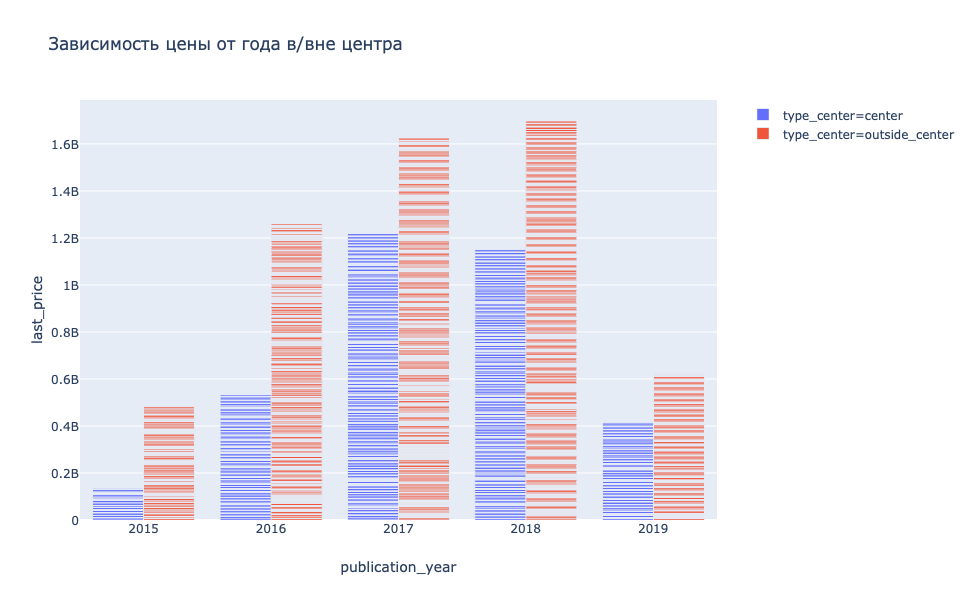

In [59]:
date_spb_pivot = df_spb.pivot_table(index=['type_center', 'publication_year', 'publication_month', 'publication_day'], values = ['last_price']).reset_index()

fig = px.bar(date_spb_pivot, x='publication_year', y='last_price', color='type_center', title='Зависимость цены от года в/вне центра', barmode='group')
fig.show()


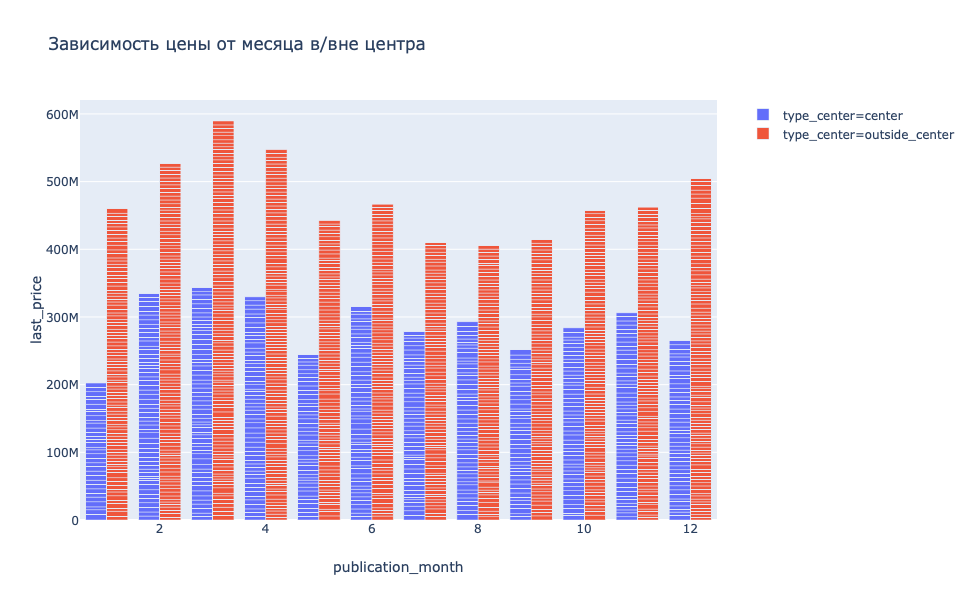

In [60]:
fig = px.bar(date_spb_pivot, x='publication_month', y='last_price', color='type_center', title='Зависимость цены от месяца в/вне центра', barmode='group')
fig.show()

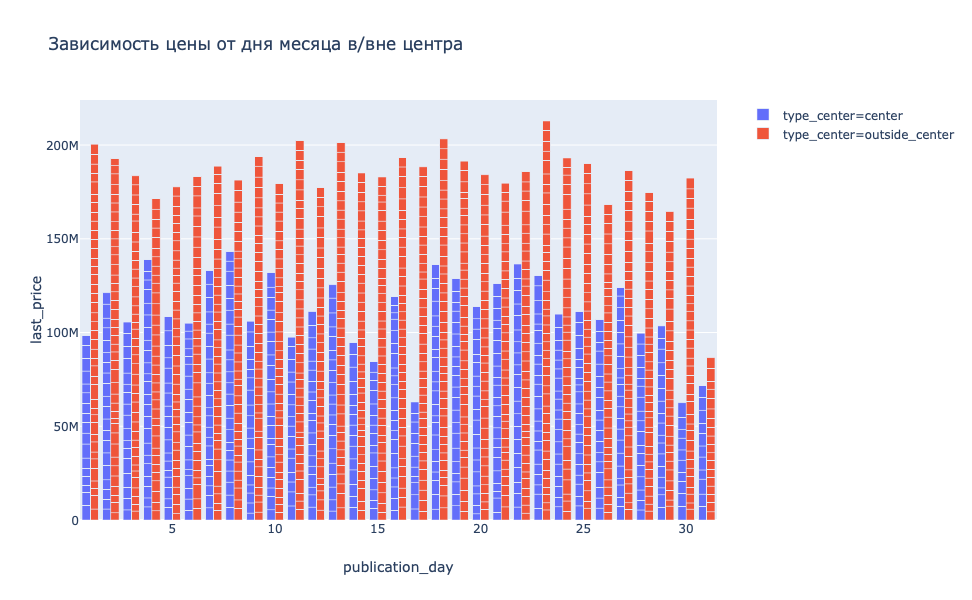

In [61]:
fig = px.bar(date_spb_pivot, x='publication_day', y='last_price', color='type_center', title='Зависимость цены от дня месяца в/вне центра', barmode='group')
fig.show()

### Вывод  
На цену в Санкт-Петербурге влияет в основном общая площадь, количество комнат. 

### 5. Общий вывод.

В данном наборе данных площадь квартир в основном 30-100 м2, с пиком в 40 м2. Цены за квадратный метр варьируются в среднем от 30000 до 150 000. Средняя цена за кв метр в Санкт-Петербурге 114 849 руб. Количество комнат в основном 1-2, высота потолков 2-4 метра.

Время продажи колеблется от 1 дня до 1600 дней, медианное время продажи квартиры 121 дней. Очень быстрая продажа - это значения меньше 45 дней, а долгая - больше 209 дней. Основная часть квартир имеет цену от 1 млн до 8 млн рублей.

Наблюдается линейная зависимость между общей площадью и конечной ценой. Разброс цен увеличивается с увеличением количества комнат. 

Увеличение общей площади и количества комнат уменьшает цену за квадратный метр, эта тенденция появилась после удаления выбросов из данных, возможно, потому что убрали все безумно дорогие квартиры с большим количеством комнат и квадратных метров.  

При отдалении от центра, цены уменьшаются, что логично.

Цены на первом и последнем этажах в среднем дешевле, чем на остальных.

Цены на квартиры растут с 2014 года, месяц и день публикации сильно не влияет на цену.

Область с радиусом 7 км считается центром. Проанализировав данные о квартирах в Санкт-Петербурге и области, и изучив подробней непосредственно Санкт-Петербург и его центр, можно прийти к выводу: 

В центре Санкт-Петербурга и вне его также линейная зависимость цены от площади,  но чем дальше от центра, могут встречаться очень большие квартиры по небольшой цене.

Цена увеличивается при увеличении числа комнат. Высота потолков в центре выше.
Квартиры не на первом и не на последнем этажах дороже, но в центре разница между средней ценой квартиры на последнем и "другом" этаже менее выражена.

Корреляция между отдалением от центра и ценой квартир сильнее в центре, чем вне его.
